# Energy balance in Poland 2021

## Simple optimization

In [27]:
%env LD_LIBRARY_PATH=/usr/local/lib:${LD_LIBRARY_PATH}

env: LD_LIBRARY_PATH=/usr/local/lib:${LD_LIBRARY_PATH}


In [1]:
import datetime as dt
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.subplots
from plotly import graph_objects as go

from energy_simulation.lcoe import EnergySource, calculate_lcoe

## Costs

In [2]:
wind_onshore = EnergySource(cost_per_gw=5.4,
                            max_power_perc=0.36,
                            o_and_m_per_gw_per_year=0.065,
                            o_and_m_per_twh=0.007,
                            years_to_launch=2,
                            years_of_operation=25)

wind_offshore = EnergySource(cost_per_gw=12.0,
                             max_power_perc=0.5,
                             o_and_m_per_gw_per_year=0.184,
                             o_and_m_per_twh=0.014,
                             years_to_launch=4,
                             years_of_operation=20)

pv = EnergySource(cost_per_gw=2.2,
                  max_power_perc=0.11,
                  o_and_m_per_gw_per_year=0.052,
                  o_and_m_per_twh=0.0,
                  years_to_launch=1,
                  years_of_operation=30)

nuclear = EnergySource(cost_per_gw=35,
                       max_power_perc=0.85,
                       o_and_m_per_gw_per_year=0.5,
                       o_and_m_per_twh=0.016,
                       years_to_launch=10,
                       years_of_operation=60)

gas = EnergySource(cost_per_gw=4,
                   max_power_perc=0.2,  # 0.01859,  # should be 20% originally
                   o_and_m_per_gw_per_year=0.0,
                   o_and_m_per_twh=0.5,
                   years_to_launch=3,
                   years_of_operation=40)

batteries = EnergySource(cost_per_gw=1,
                         max_power_perc=0.85,
                         o_and_m_per_gw_per_year=0,
                         o_and_m_per_twh=0,
                         years_to_launch=1,
                         years_of_operation=20)

psh = EnergySource(cost_per_gw=0.1,
                   max_power_perc=0.85,
                   o_and_m_per_gw_per_year=0,
                   o_and_m_per_twh=0,
                   years_to_launch=10,
                   years_of_operation=100)

heat_storage = EnergySource(cost_per_gw=0.01,
                            max_power_perc=0.85,
                            o_and_m_per_gw_per_year=0,
                            o_and_m_per_twh=0,
                            years_to_launch=2,
                            years_of_operation=100)

## LCOE

In [3]:
wind_onshore_lcoe = calculate_lcoe(wind_onshore, discount_factor=0.05)
wind_offshore_lcoe = calculate_lcoe(wind_offshore, discount_factor=0.05)
pv_lcoe = calculate_lcoe(pv, discount_factor=0.05)
nuclear_lcoe = calculate_lcoe(nuclear, discount_factor=0.05)
gas_lcoe = calculate_lcoe(gas, discount_factor=0.05)

batteries_lcoe = calculate_lcoe(batteries, discount_factor=0.05)
psh_lcoe = calculate_lcoe(psh, discount_factor=0.05)
heat_storage_lcoe = calculate_lcoe(heat_storage, discount_factor=0.05)

lcoe_x = [wind_onshore_lcoe, wind_offshore_lcoe, pv_lcoe, nuclear_lcoe, gas_lcoe]
lcoe_y = [batteries_lcoe, psh_lcoe, heat_storage_lcoe]

## Data

In [4]:
df = pd.read_csv("../data.csv", parse_dates=[1], date_format="%m/%d/%y %H:%M").drop(columns=['id'])
df['nuclear'] = nuclear.max_power_perc

### Aggregate daily

In [5]:
df = (
    df
    .groupby(df['datetime'].dt.month)
    [['demand', 'wind_onshore', 'wind_offshore', 'pv', 'nuclear']]
    .sum()
    .reset_index()
)
df

,datetime,demand,wind_onshore,wind_offshore,pv,nuclear
0,1,15541.74,260.78,365.58,19.48,632.4
1,2,14562.74,259.55,372.60,37.30,571.2
2,3,15343.05,270.51,359.07,76.35,632.4
3,4,13821.60,258.98,368.68,106.36,612.0
4,5,13623.55,263.01,371.85,137.30,632.4
5,6,13651.30,120.77,175.73,165.82,612.0
6,7,14454.49,128.79,193.64,140.82,632.4
7,8,13894.50,192.95,282.93,108.18,632.4
8,9,13930.68,191.16,273.00,88.79,612.0
9,10,14658.94,334.22,452.27,62.95,632.4


## Optimize

Parameters:

$I = \{wind\_offshore, wind\_onshore, pv, nuclear, gas\}$ - energy sources

$t=1 \dots T$ - timestamps

Coefficients:

$\forall_{t=1, \dots T} d^{(t)}$ - demand for day $t$

$\forall_{t=1, \dots T, i \in I \setminus \{gas\}} x_i$ - fraction of power produced by energy source $i$ at time $t$ [%]

$\forall_{i \in I} \text{LCOE}_i$ - Levelized Cost Of Energy for energy source $i$ [PLN/MWh]

Variables:

$\forall_{i \in I} P_i$ - installed power for energy source $i$ [GW]

$\forall_{t=1 \dots T} x_{gas}$ - fraction of power applied for gas generators at day $t$ [%]

Constraints:

$\forall_{t=1, \dots T} \sum_{i \in I}^n P_i^t x_i^{(t)} \ge d^{(t)}$

$\forall_{t=1, \dots T} x_{gas, min} \le x_{gas}^{(t)} \le x_{gas, max} $

Cost function:

$J = min \sum_{t=1}^T \sum_{i \in I}^n \text{LCOE}_i P_i x_i^{(t)}$

In [6]:
import pyomo.environ as pyo

In [7]:
T = len(df)
I = ['wind_onshore', 'wind_offshore', 'pv', 'nuclear']

In [8]:
lcoe = {
    'wind_onshore': wind_onshore_lcoe,
    'wind_offshore': wind_offshore_lcoe,
    'pv': pv_lcoe,
    'nuclear': nuclear_lcoe,
}

In [9]:
X_GAS_MIN = 0.1
X_GAS_MAX = 0.85


def energy_balance(m, t):
    return sum(m.p[i] * m.x[t, i] for i in m.I) + (m.p_gas * m.x_gas[t]) >= m.d[t]

In [10]:
def cost_objective(m):
    return sum(sum(m.lcoe[i] * m.p[i] * m.x[t, i] for i in m.I) + (m.lcoe_gas * m.p_gas * m.x_gas[t]) for t in m.T)

In [29]:
model = pyo.ConcreteModel()

model.T = pyo.RangeSet(0, T-1)
model.I = pyo.Set(initialize=I)

model.d = pyo.Param(model.T, initialize=lambda model, t: df.loc[t, 'demand'])
model.x = pyo.Param(model.T, model.I, initialize=lambda model, t, i: df.loc[t, i])
model.lcoe = pyo.Param(model.I, initialize=lcoe)
model.lcoe_gas = pyo.Param(initialize=gas_lcoe)

model.x_gas = pyo.Var(model.T, domain=pyo.NonNegativeReals, bounds=(X_GAS_MIN, X_GAS_MAX))
model.p = pyo.Var(model.I, domain=pyo.NonNegativeReals)
model.p_gas = pyo.Var(domain=pyo.NonNegativeReals)

model.energy_balance = pyo.Constraint(model.T, rule=energy_balance)

model.obj = pyo.Objective(rule=cost_objective, sense=pyo.minimize)

In [30]:
opt = pyo.SolverFactory('ipopt')
opt.solve(model)

{'Problem': [{'Lower bound': -inf, 'Upper bound': inf, 'Number of objectives': 1, 'Number of constraints': 12, 'Number of variables': 17, 'Sense': 'unknown'}], 'Solver': [{'Status': 'ok', 'Message': 'Ipopt 3.14.15\\x3a Optimal Solution Found', 'Termination condition': 'optimal', 'Id': 0, 'Error rc': 0, 'Time': 0.022963762283325195}], 'Solution': [OrderedDict([('number of solutions', 0), ('number of solutions displayed', 0)])]}

## Variables

### Power

In [5]:
wind_onshore_gw = 70
wind_offshore_gw = 25
pv_gw = 85
nuclear_gw = 3
gas_gw = 13

### Storage

In [6]:
batteries_gwh = 40
ev_batteries_gwh = 50
psh_gwh = 10
storage_gwh = batteries_gwh + ev_batteries_gwh + psh_gwh

In [11]:
n = 5 # Number of energy sources
m = 3 # Number of energy storages

In [7]:
# Supply
df['energy_wind_onshore'] = df['wind_onshore'] * wind_onshore_gw
df['energy_wind_offshore'] = df['wind_offshore'] * wind_offshore_gw
df['energy_pv'] = df['pv'] * pv_gw
df['energy_nuclear'] = nuclear_gw * nuclear.max_power_perc
df['total_energy'] = df['energy_wind_onshore'] + df['energy_wind_offshore'] + df['energy_pv'] + df['energy_nuclear']

## Energy balance charts

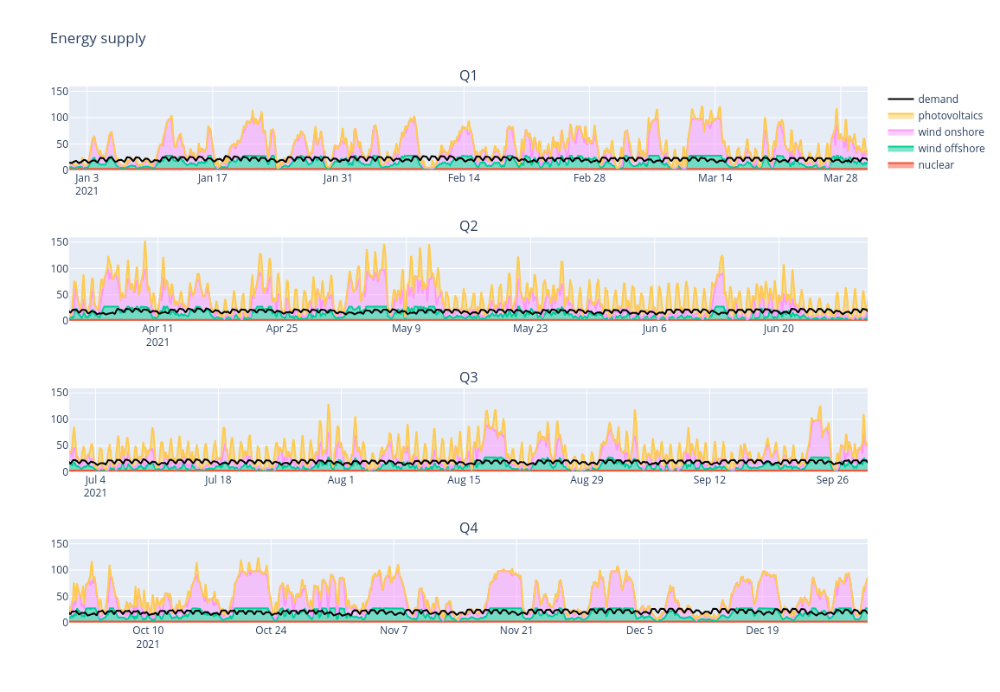

In [11]:
fig = plotly.subplots.make_subplots(
    rows=4,
    cols=1,
    subplot_titles=["Q1", "Q2", "Q3", "Q4"],
)

traces = [
    go.Scatter(x=df['datetime'], y=df['energy_nuclear'], legendgroup="nuclear", name='nuclear', stackgroup='1', line=dict(color='#EF553B')),
    go.Scatter(x=df['datetime'], y=df['energy_wind_offshore'], legendgroup="wind offshore", name='wind offshore', stackgroup='1', line=dict(color='#00CC96')),
    go.Scatter(x=df['datetime'], y=df['energy_wind_onshore'], legendgroup="wind onshore", name='wind onshore', stackgroup='1', line=dict(color='#FF97FF')),
    go.Scatter(x=df['datetime'], y=df['energy_pv'], legendgroup="photovoltaics", name='photovoltaics', stackgroup='1', line=dict(color='#FECB52')),
    go.Scatter(x=df['datetime'], y=df['demand'], legendgroup="deamnd", name='demand', mode='lines', line=dict(color='black')),
]
fig.add_traces(traces, rows=1, cols=1)
fig.update_xaxes(range=[dt.date(2021, 1, 1), dt.date(2021, 3, 31)], row=1, col=1)

traces = [
    go.Scatter(x=df['datetime'], y=df['energy_nuclear'], legendgroup="nuclear", name='nuclear', stackgroup='1', line=dict(color='#EF553B'), showlegend=False),
    go.Scatter(x=df['datetime'], y=df['energy_wind_offshore'], legendgroup="wind offshore", name='wind offshore', stackgroup='1', line=dict(color='#00CC96'), showlegend=False),
    go.Scatter(x=df['datetime'], y=df['energy_wind_onshore'], legendgroup="wind onshore", name='wind onshore', stackgroup='1', line=dict(color='#FF97FF'), showlegend=False),
    go.Scatter(x=df['datetime'], y=df['energy_pv'], legendgroup="photovoltaics", name='photovoltaics', stackgroup='1', line=dict(color='#FECB52'), showlegend=False),
    go.Scatter(x=df['datetime'], y=df['demand'], legendgroup="deamnd", name='demand', mode='lines', line=dict(color='black'), showlegend=False),
]
fig.add_traces(traces, rows=2, cols=1)
fig.update_xaxes(range=[dt.date(2021, 4, 1), dt.date(2021, 6, 30)], row=2, col=1)

traces = [
    go.Scatter(x=df['datetime'], y=df['energy_nuclear'], legendgroup="nuclear", name='nuclear', stackgroup='1', line=dict(color='#EF553B'), showlegend=False),
    go.Scatter(x=df['datetime'], y=df['energy_wind_offshore'], legendgroup="wind offshore", name='wind offshore', stackgroup='1', line=dict(color='#00CC96'), showlegend=False),
    go.Scatter(x=df['datetime'], y=df['energy_wind_onshore'], legendgroup="wind onshore", name='wind onshore', stackgroup='1', line=dict(color='#FF97FF'), showlegend=False),
    go.Scatter(x=df['datetime'], y=df['energy_pv'], legendgroup="photovoltaics", name='photovoltaics', stackgroup='1', line=dict(color='#FECB52'), showlegend=False),
    go.Scatter(x=df['datetime'], y=df['demand'], legendgroup="deamnd", name='demand', mode='lines', line=dict(color='black'), showlegend=False),
]
fig.add_traces(traces, rows=3, cols=1)
fig.update_xaxes(range=[dt.date(2021, 7, 1), dt.date(2021, 9, 30)], row=3, col=1)

traces = [
    go.Scatter(x=df['datetime'], y=df['energy_nuclear'], legendgroup="nuclear", name='nuclear', stackgroup='1', line=dict(color='#EF553B'), showlegend=False),
    go.Scatter(x=df['datetime'], y=df['energy_wind_offshore'], legendgroup="wind offshore", name='wind offshore', stackgroup='1', line=dict(color='#00CC96'), showlegend=False),
    go.Scatter(x=df['datetime'], y=df['energy_wind_onshore'], legendgroup="wind onshore", name='wind onshore', stackgroup='1', line=dict(color='#FF97FF'), showlegend=False),
    go.Scatter(x=df['datetime'], y=df['energy_pv'], legendgroup="photovoltaics", name='photovoltaics', stackgroup='1', line=dict(color='#FECB52'), showlegend=False),
    go.Scatter(x=df['datetime'], y=df['demand'], legendgroup="deamnd", name='demand', mode='lines', line=dict(color='black'), showlegend=False),
]
fig.add_traces(traces, rows=4, cols=1)
fig.update_xaxes(range=[dt.date(2021, 10, 1), dt.date(2021, 12, 31)], row=4, col=1)

fig.update_layout(height=800, title='Energy supply', legend_traceorder="reversed")
fig.show()